In [11]:
from keras.models import load_model
from SiameseModel import SiameseModel
from SiameseLoader import SiameseLoader
import glob
import os
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', 500)
import random
import matplotlib.pyplot as plt
import itertools

import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, roc_curve


In [2]:
loader = SiameseLoader('./data')

loading snake breed: 152
loading snake breed: 159
loading snake breed: 80
loading snake breed: 187
loading snake breed: 3


/usr/local/lib/python3.5/dist-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


loading snake breed: 46
loading snake breed: 158
loading snake breed: 87
loading snake breed: 123
loading snake breed: 100
loading snake breed: 205
loading snake breed: 197
loading snake breed: 120
loading snake breed: 61
loading snake breed: 124
loading snake breed: 67
loading snake breed: 110
loading snake breed: 44
loading snake breed: 203
loading snake breed: 32
loading snake breed: 43
loading snake breed: 111
loading snake breed: 219
loading snake breed: 156
loading snake breed: 175
loading snake breed: 193
loading snake breed: 201
loading snake breed: 88
loading snake breed: 83
loading snake breed: 109
loading snake breed: 107
loading snake breed: 185
loading snake breed: 89
loading snake breed: 206
loading snake breed: 165
loading snake breed: 127
loading snake breed: 15
loading snake breed: 230
loading snake breed: 204
loading snake breed: 21
loading snake breed: 66
loading snake breed: 167
loading snake breed: 63
loading snake breed: 128
loading snake breed: 45
loading snake b

In [3]:
ckpts = glob.glob("checkpoints/*.hdf5")
latest_ckpt = max(ckpts, key=os.path.getctime)
print("loading from checkpoint: ", latest_ckpt)
initial_epoch = int(latest_ckpt[latest_ckpt.find("-epoch-") + len("-epoch-"):latest_ckpt.rfind("-lr-")])
model = load_model(latest_ckpt)

loading from checkpoint:  checkpoints/flowchroma-epoch-00310-lr--train_loss-0.5502-val_loss-0.5882.hdf5


/usr/local/lib/python3.5/dist-packages/keras/engine/topology.py:1271: UserWarning: The `Merge` layer is deprecated and will be removed after 08/2017. Use instead layers from `keras.layers.merge`, e.g. `add`, `concatenate`, etc.
  return cls(**config)


In [4]:
def find_accuracy(df):
    correct =  df.loc[df['predictions'] == df['targets']].shape[0]
    incorrect = df.loc[df['predictions'] != df['targets']].shape[0]
    total = df.shape[0]
    print('Accuracy : {}%'.format(100*correct/total))
    return correct, incorrect, total
    

In [5]:
def draw_image_side_by_side(img1, img2):
    fig, axarr = plt.subplots(1,2)
    axarr[0].imshow(img1)
    axarr[1].imshow(img2)
    plt.show()

In [6]:
sample_size = 20
pairs, targets = loader.get_validation_batch(sample_size)

In [21]:
prediction = model.predict(pairs)
df = pd.DataFrame(data={'predictions':prediction.reshape(prediction.shape[0]), 'targets':targets.reshape(targets.shape[0])})
df.loc[df['predictions'] >= 0.5, 'predictions'] = 1
df.loc[df['predictions'] < 0.5, 'predictions'] = 0
find_accuracy(df)
for i in range(prediction.size):
    if (prediction[i]>=0.5):
        prediction[i] = 1
    else:
        prediction[i] = 0


Accuracy : 75.0%


In [37]:
def plot_conf_mat(cm, title="Confusion Matrix"):
    """
    Plots the confusion matrix. Modified verison from 
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    Inputs: 
        cm: confusion matrix
        title: Title of plot
    """
    classes=["Match", "Mismatch"]    
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.bone)
    plt.title(title)
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    thresh = cm.mean()
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j]), 
                 horizontalalignment="center",
                 color="white" if cm[i, j] < thresh else "black")

def print_scores(pred, y):
    acc = accuracy_score(y, pred)
    auc = roc_auc_score(y, pred)

    print("Accuracy: ", acc)
    print("Area Under ROC : ", auc)
    
    conf_mat = confusion_matrix(y, pred)
#     plot_conf_mat(conf_mat, title="Confusion Matrix")
    
    fpr, tpr, _ = roc_curve(y,  pred)
    plt.title("ROC")
    plt.plot(fpr,tpr,label="auc={0}".format(str(auc)))
    plt.legend(loc=4)
    plt.show()


Accuracy:  0.75
Area Under ROC :  0.75


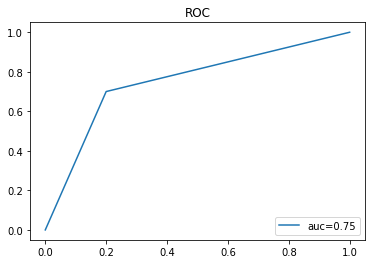

In [38]:
print_scores(prediction, targets)

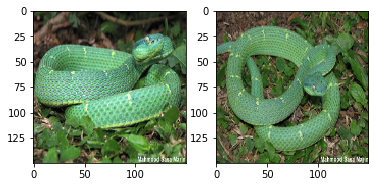

Select 1 or 0
1
Correct.
1
1
Accuracy 100.0%


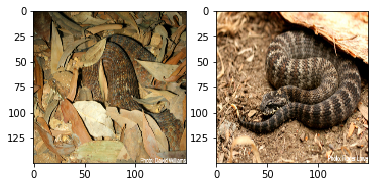

Select 1 or 0
1
Correct.
2
2
Accuracy 100.0%


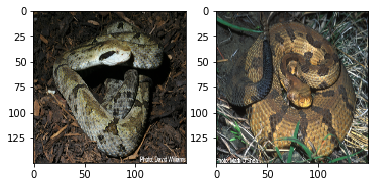

Select 1 or 0
0
Correct.
3
3
Accuracy 100.0%


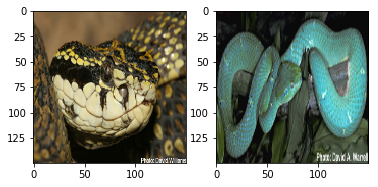

Select 1 or 0
0
Correct.
4
4
Accuracy 100.0%


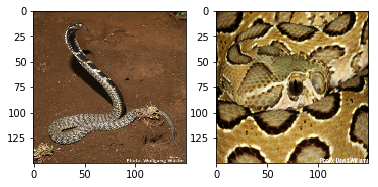

Select 1 or 0
0
Correct.
5
5
Accuracy 100.0%


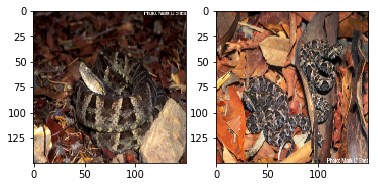

Select 1 or 0
1
Correct.
6
6
Accuracy 100.0%


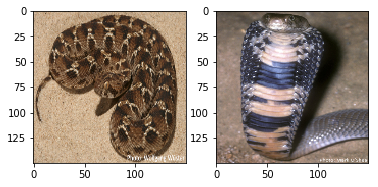

Select 1 or 0
0
Correct.
7
7
Accuracy 100.0%


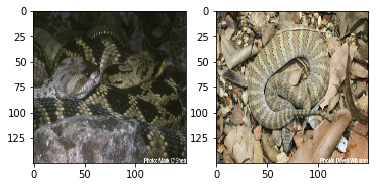

Select 1 or 0
0
Correct.
8
8
Accuracy 100.0%


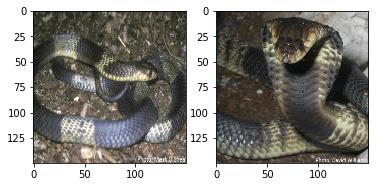

Select 1 or 0
1
Correct.
9
9
Accuracy 100.0%


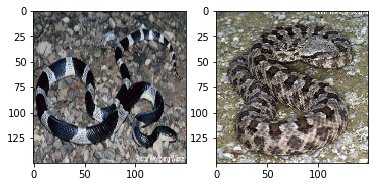

Select 1 or 0
0
Correct.
10
10
Accuracy 100.0%


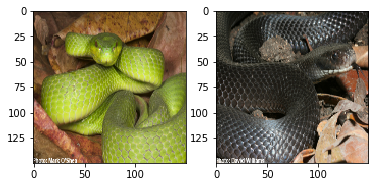

Select 1 or 0
0
Correct.
11
11
Accuracy 100.0%


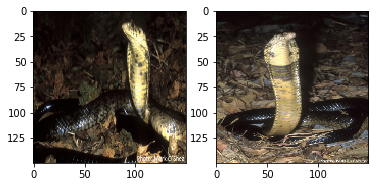

Select 1 or 0
1
Correct.
12
12
Accuracy 100.0%


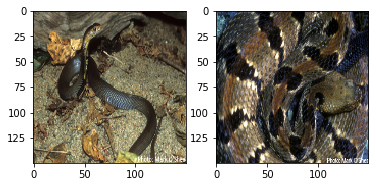

Select 1 or 0
0
Correct.
13
13
Accuracy 100.0%


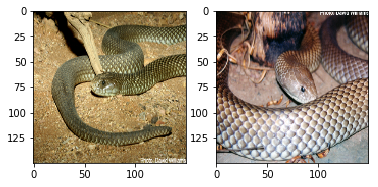

Select 1 or 0
0
Incorrect
13
14
Accuracy 92.85714285714286%


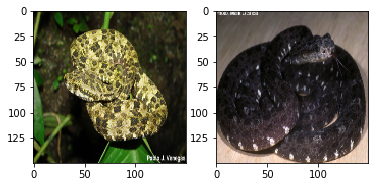

Select 1 or 0
0
Incorrect
13
15
Accuracy 86.66666666666667%


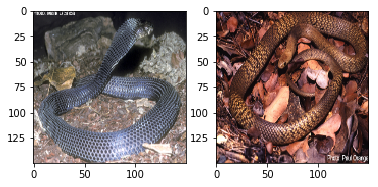

Select 1 or 0
0
Correct.
14
16
Accuracy 87.5%


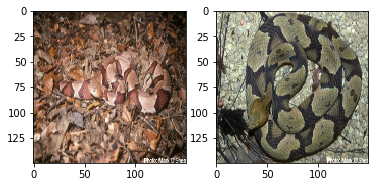

Select 1 or 0
0
Incorrect
14
17
Accuracy 82.3529411764706%


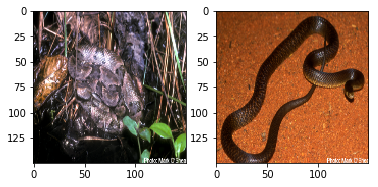

Select 1 or 0
0
Correct.
15
18
Accuracy 83.33333333333333%


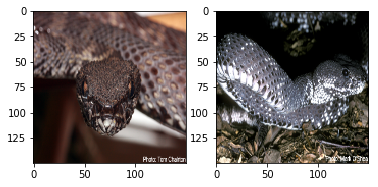

Select 1 or 0
1
Correct.
16
19
Accuracy 84.21052631578948%


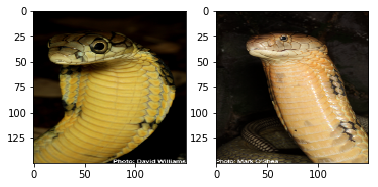

Select 1 or 0
1
Correct.
17
20
Accuracy 85.0%
Final Accuracy: 0.85


In [35]:
ncorrect = 0
ntotal = 0
human_predictions = []
human_targets = []
for i in random.sample(range(0, sample_size), sample_size):
    draw_image_side_by_side(pairs[0][i],pairs[1][i])
    target = targets[i]
    a = -1
    while (a!=0 and a!=1):
        print('Select 1 or 0')
        a = int(input())
    ntotal+=1
    human_predictions.append(a)
    human_targets.append(target)
    if (target == a):
        ncorrect+=1
        print('Correct.')
    else:
        print('Incorrect')
    print(ncorrect)
    print(ntotal)
    print('Accuracy {}%'.format(ncorrect*100/ntotal))
print('Final Accuracy: {}'.format(ncorrect/ntotal))   

Accuracy:  0.85
Area Under ROC :  0.85


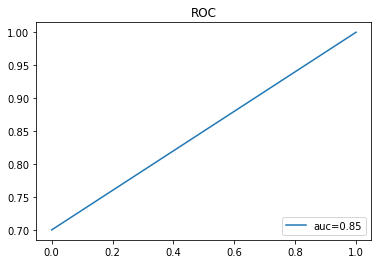

In [39]:
print_scores(human_predictions, human_targets)

In [33]:
print(human_predictions)

[0 1 0 0 1 1 0 0 0 1 0 0 0 0 0 0 1 0 1 0]


In [34]:
print(targets)

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]


# Class prediction accuracy

In [11]:
pairs, targets = loader.make_oneshot_task(test_case_id=3)

In [80]:
def draw_reference_images(images):
    fig, axarr = plt.subplots(nrows=21, ncols=4, figsize=(20,100))
    
#     fig.set_size_inches(100, 10.5)
    fig.tight_layout() 

    for row in range(21):
        for col in range(4):
            img = images[row*4+col]
            axarr[row][col].imshow(img)
            axarr[row][col].set_xlabel('Image id: {}'.format(row*4+col+1))
#     fig.savefig('image2.png')
    plt.show()

In [ ]:
def draw_reference_images_for_paper(images):
    fig, axarr = plt.subplots(nrows=21, ncols=4, figsize=(20,100))
    
#     fig.set_size_inches(100, 10.5)
    fig.tight_layout() 

    for row in range(21):
        for col in range(4):
            img = images[row*4+col]
            axarr[row][col].imshow(img)
            axarr[row][col].set_xlabel('Image id: {}'.format(row*4+col+1))
#     fig.savefig('image2.png')
    plt.show()

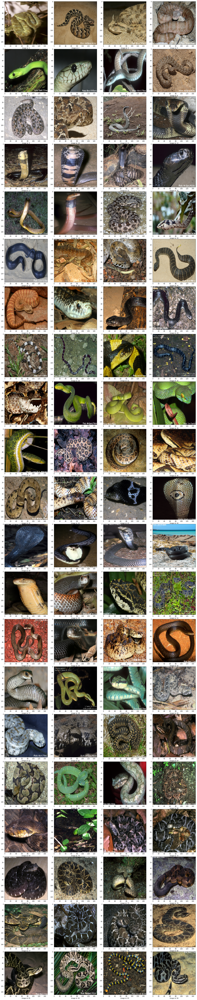

In [81]:
draw_reference_images(pairs[1])

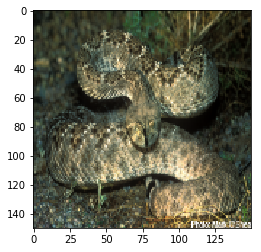

19
NOt a correct classification. Correct classification is: 75
Total: 1, Correct: 0, Accuracy: 0.0%


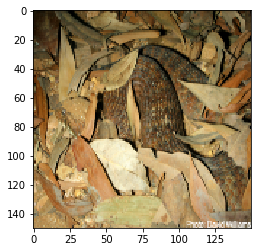

22
Correct classification
Total: 2, Correct: 1, Accuracy: 50.0%


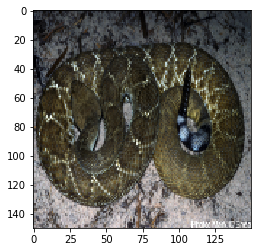

10
NOt a correct classification. Correct classification is: 79
Total: 3, Correct: 1, Accuracy: 33.333333333333336%


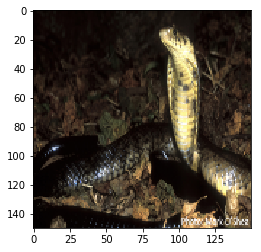

46
NOt a correct classification. Correct classification is: 13
Total: 4, Correct: 1, Accuracy: 25.0%


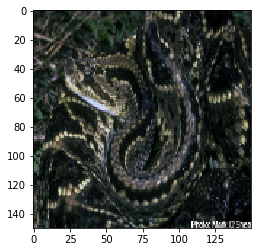

15
NOt a correct classification. Correct classification is: 81
Total: 5, Correct: 1, Accuracy: 20.0%


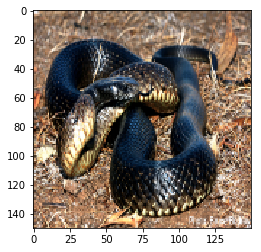

27
NOt a correct classification. Correct classification is: 55
Total: 6, Correct: 1, Accuracy: 16.666666666666668%


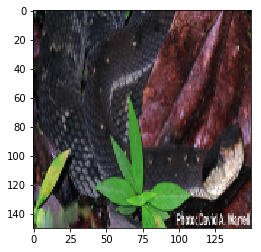

54
NOt a correct classification. Correct classification is: 70
Total: 7, Correct: 1, Accuracy: 14.285714285714286%


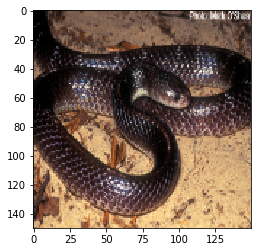

54
NOt a correct classification. Correct classification is: 28
Total: 8, Correct: 1, Accuracy: 12.5%


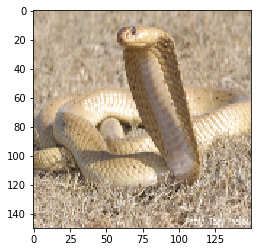

44
NOt a correct classification. Correct classification is: 17
Total: 9, Correct: 1, Accuracy: 11.11111111111111%


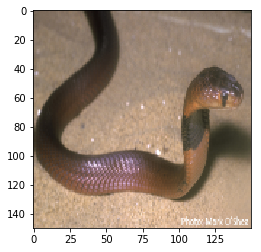

18
Correct classification
Total: 10, Correct: 2, Accuracy: 20.0%


In [93]:
total = 0 
correct = 0
sample_size = 10
for i in random.sample(range(0, 84), sample_size):
    pairs, targets = loader.make_oneshot_task(test_case_id=i)
    plt.imshow(pairs[0][0])
    plt.show()
    total = total + 1
    ans = int(input())
    if (np.argmax(targets)+1) == ans:
        correct+=1
        print('Correct classification')
    else:
        print('NOt a correct classification. Correct classification is: {}'.format((np.argmax(targets)+1)))
    print('Total: {}, Correct: {}, Accuracy: {}%'.format(total, correct, correct*100/total))

In [83]:
54

3
